# About Dataset

In [2]:
## Önemli kodlar

#tf.keras.metrics.Recall(
#    thresholds=None, top_k=None, class_id=None, name=None, dtype=None)

#model.compile(optimizer = "adam",loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),metrics = ["accuracy"])

**Age :** the age of the person

**Occupation :** the occupation of the person

**Annual_Income :** the annual income of the person

**Num_Bank_Accounts :** the number of bank accounts a person holds

**Num_Credit_Card :** the number of other credit cards held by a person

**Interest_Rate :** the interest rate on credit card

**Num_of_Loan :** the number of loans taken from the bank

**Delay_from_due_date :** the average number of days delayed from the payment date

**Num_of_Delayed_Payment :** the average number of payments delayed by a person

**Changed_Credit_Limit :** the percentage change in credit card limit

**Num_Credit_Inquiries :** the number of credit card inquiries

**Outstanding_Debt :** the remaining debt to be paid (in USD)

**Credit_Utilization_Ratio :** the utilization ratio of credit card

**Credit_History_Age :** the age of credit history of the person

**Payment_of_Min_Amount :** whether only the minimum amount was paid by the person

**Total_EMI_per_month :** the monthly EMI payments (in USD)

**Amount_invested_monthly :** the monthly amount invested by the customer (in USD)

**Monthly_Balance :** the monthly balance amount of the customer (in USD)


# Import Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

plt.rcParams["figure.figsize"] = (10,6)

sns.set_style("whitegrid")
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# Set it None to display all rows in the dataframe
# pd.set_option('display.max_rows', None)

# Set it to None to display all columns in the dataframe
pd.set_option('display.max_columns', None)

In [2]:
df = pd.read_csv("credit_score_without_dummy.csv")

# Exploratory Data Analysis and Visualization

In [3]:
df.head()

,Age,Occupation,Annual_Income,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score
0,23,Scientist,19114.120,3.000,4.000,3.000,4.000,3,7.000,11.270,4.000,809.980,26.823,265,No,49.575,80.415,312.494,Good
1,23,Scientist,19114.120,3.000,4.000,3.000,4.000,-1,4.000,11.270,4.000,809.980,31.945,266,No,49.575,118.280,284.629,Good
2,23,Scientist,19114.120,3.000,4.000,3.000,4.000,3,7.000,11.270,4.000,809.980,28.609,267,No,49.575,81.700,331.210,Good
3,23,Scientist,19114.120,3.000,4.000,3.000,4.000,5,4.000,6.270,4.000,809.980,31.378,268,No,49.575,199.458,223.451,Good
4,23,Scientist,19114.120,3.000,4.000,3.000,4.000,6,4.000,11.270,4.000,809.980,24.797,269,No,49.575,41.420,341.489,Good


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 98288 entries, 0 to 98287
Data columns (total 19 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       98288 non-null  int64  
 1   Occupation                98288 non-null  object 
 2   Annual_Income             98288 non-null  float64
 3   Num_Bank_Accounts         98288 non-null  float64
 4   Num_Credit_Card           98288 non-null  float64
 5   Interest_Rate             98288 non-null  float64
 6   Num_of_Loan               98288 non-null  float64
 7   Delay_from_due_date       98288 non-null  int64  
 8   Num_of_Delayed_Payment    98288 non-null  float64
 9   Changed_Credit_Limit      98288 non-null  float64
 10  Num_Credit_Inquiries      98288 non-null  float64
 11  Outstanding_Debt          98288 non-null  float64
 12  Credit_Utilization_Ratio  98288 non-null  float64
 13  Credit_History_Age        98288 non-null  int64  
 14  Paymen

In [5]:
df.describe()

,Age,Annual_Income,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
count,98288.000,98288.000,98288.000,98288.000,98288.000,98288.000,98288.000,98288.000,98288.000,98288.000,98288.000,98288.000,98288.000,98288.000,98288.000,98288.000
mean,33.272,48435.582,5.415,5.556,14.670,3.561,21.277,13.452,10.466,5.823,1438.582,32.226,218.096,89.604,188.226,394.003
std,10.758,35244.871,2.583,2.066,8.741,2.452,14.881,6.230,6.803,3.866,1160.069,5.088,101.252,82.502,182.254,200.099
min,14.000,7005.930,0.000,0.000,1.000,0.000,-5.000,0.000,-6.490,0.000,0.230,20.000,-1.000,0.000,0.000,0.008
25%,24.000,19206.920,4.000,4.000,8.000,2.000,10.000,9.000,5.390,3.000,573.520,28.007,140.000,27.904,73.434,269.186
50%,33.000,36459.965,6.000,5.000,13.000,3.000,18.000,14.000,9.460,6.000,1176.770,32.250,217.000,62.734,128.517,334.754
75%,42.000,69870.880,7.000,7.000,20.000,5.000,28.000,18.000,15.010,9.000,1971.130,36.445,299.000,133.108,231.040,462.648
max,56.000,152574.760,11.000,11.000,34.000,9.000,67.000,28.000,36.970,17.000,4998.070,50.000,404.000,357.406,1733.700,1602.041


In [6]:
df.shape

(98288, 19)

In [7]:
df.isnull().any().any()

False

In [8]:
df.duplicated().sum()

0

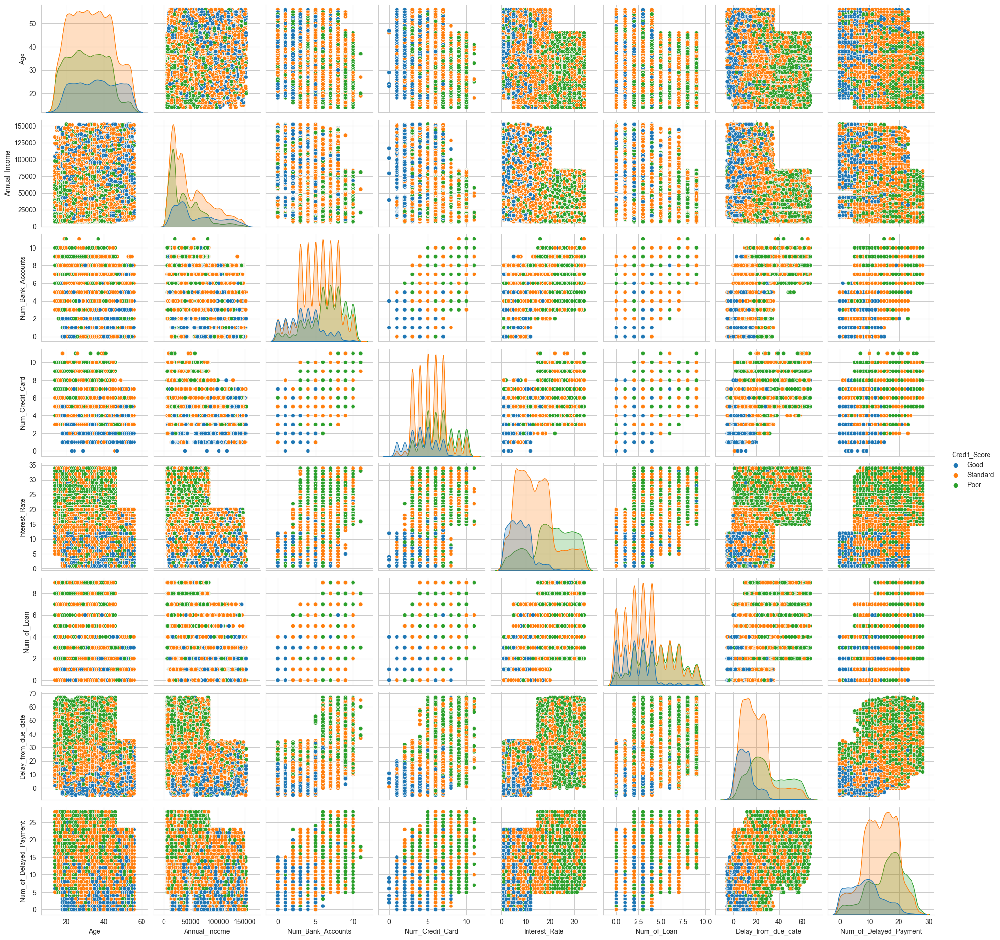

In [9]:
df1 = df[['Age', 'Occupation', 'Annual_Income', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Credit_Score']]
sns.pairplot(df1, hue="Credit_Score")
plt.show()

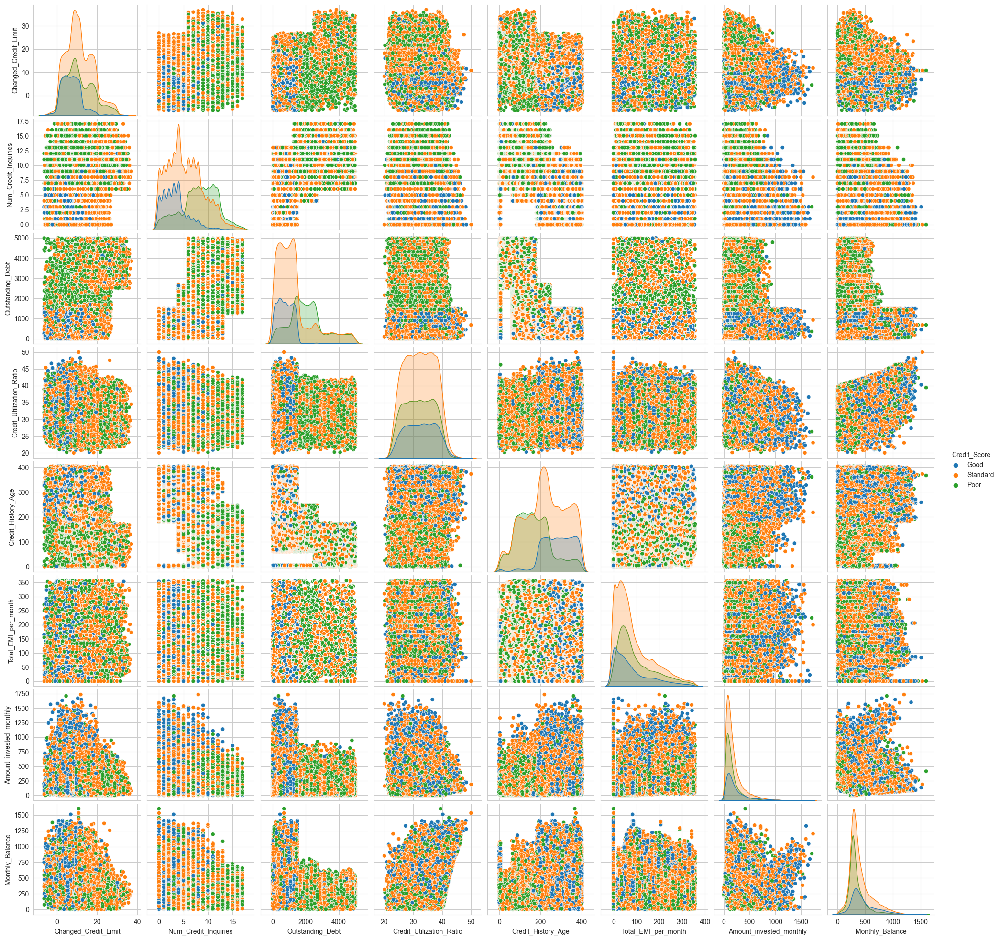

In [10]:
df2 = df[['Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Outstanding_Debt', 'Credit_Utilization_Ratio',
       'Credit_History_Age', 'Payment_of_Min_Amount', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Monthly_Balance', 'Credit_Score']]
sns.pairplot(df2, hue="Credit_Score")
plt.show()

In [11]:
df.Credit_Score.value_counts()

Standard    52509
Poor        28723
Good        17056
Name: Credit_Score, dtype: int64

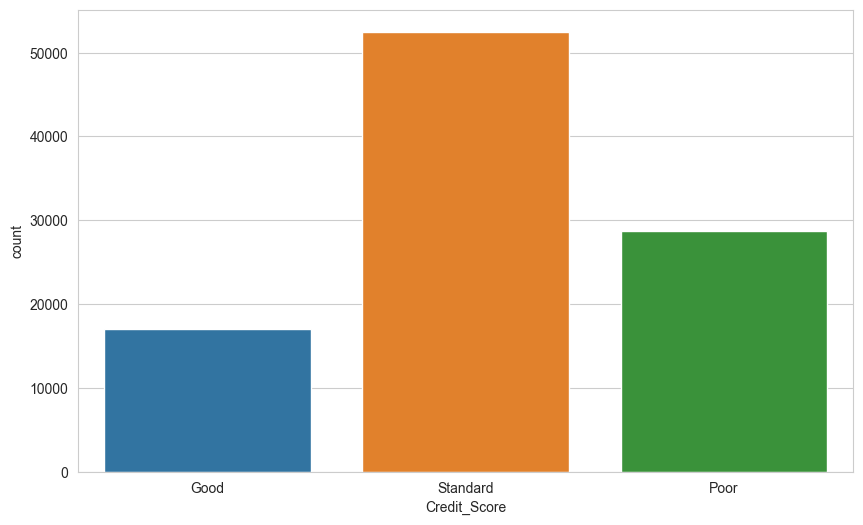

In [12]:
sns.countplot(df["Credit_Score"])
plt.show()

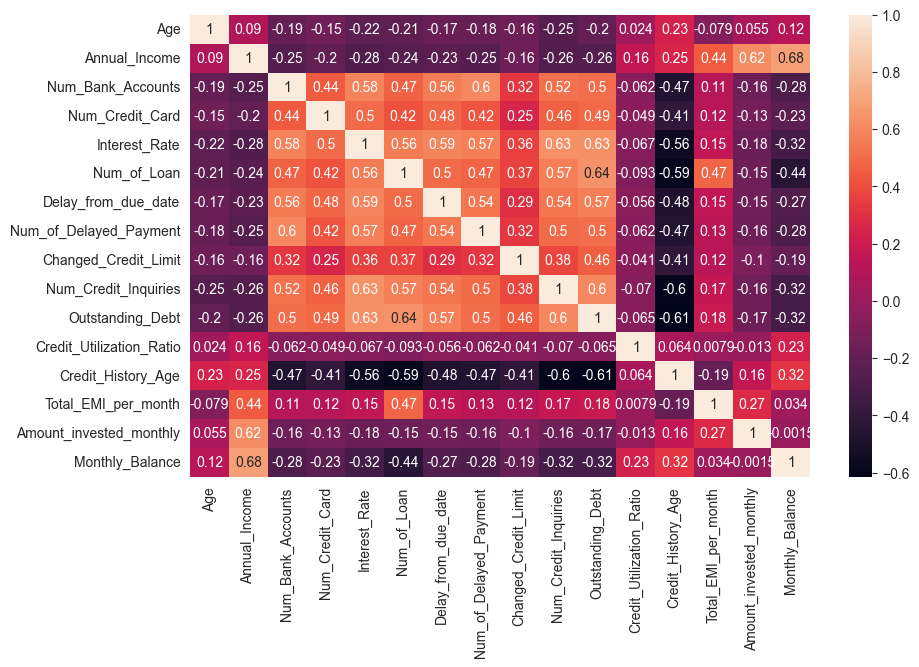

In [13]:
sns.heatmap(df.corr(),annot=True)
plt.show()

# Encoding Transaction

In [14]:
from sklearn.compose import make_column_transformer

In [15]:
from sklearn.preprocessing import OneHotEncoder

In [16]:
cat = df.drop("Credit_Score",axis=1).select_dtypes("object").columns
cat

Index(['Occupation', 'Payment_of_Min_Amount'], dtype='object')

In [17]:
df["Occupation"].value_counts()

Lawyer           6984
Engineer         6736
Architect        6696
Mechanic         6664
Scientist        6632
Media_Manager    6616
Developer        6608
Accountant       6592
Teacher          6560
Entrepreneur     6536
Doctor           6464
Journalist       6432
Manager          6304
Musician         6232
Writer           6232
Name: Occupation, dtype: int64

In [18]:
df["Payment_of_Min_Amount"].value_counts()

Yes    59432
No     38856
Name: Payment_of_Min_Amount, dtype: int64

In [19]:
column_trans = make_column_transformer((OneHotEncoder(handle_unknown="ignore", sparse=False), cat), 
                                       remainder="passthrough")

In [20]:
transformed = column_trans.fit_transform(df)

In [21]:
df = pd.DataFrame(
    transformed, 
    columns=column_trans.get_feature_names())

In [22]:
df.head()

,onehotencoder__x0_Accountant,onehotencoder__x0_Architect,onehotencoder__x0_Developer,onehotencoder__x0_Doctor,onehotencoder__x0_Engineer,onehotencoder__x0_Entrepreneur,onehotencoder__x0_Journalist,onehotencoder__x0_Lawyer,onehotencoder__x0_Manager,onehotencoder__x0_Mechanic,onehotencoder__x0_Media_Manager,onehotencoder__x0_Musician,onehotencoder__x0_Scientist,onehotencoder__x0_Teacher,onehotencoder__x0_Writer,onehotencoder__x1_No,onehotencoder__x1_Yes,Age,Annual_Income,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score
0,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,23,19114.120,3.000,4.000,3.000,4.000,3,7.000,11.270,4.000,809.980,26.823,265,49.575,80.415,312.494,Good
1,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,23,19114.120,3.000,4.000,3.000,4.000,-1,4.000,11.270,4.000,809.980,31.945,266,49.575,118.280,284.629,Good
2,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,23,19114.120,3.000,4.000,3.000,4.000,3,7.000,11.270,4.000,809.980,28.609,267,49.575,81.700,331.210,Good
3,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,23,19114.120,3.000,4.000,3.000,4.000,5,4.000,6.270,4.000,809.980,31.378,268,49.575,199.458,223.451,Good
4,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,23,19114.120,3.000,4.000,3.000,4.000,6,4.000,11.270,4.000,809.980,24.797,269,49.575,41.420,341.489,Good


In [23]:
df.shape

(98288, 34)

### Ordinal Encoding for Target Feature 

In [24]:
df["Credit_Score"]

0            Good
1            Good
2            Good
3            Good
4            Good
           ...   
98283        Poor
98284        Poor
98285        Poor
98286    Standard
98287        Poor
Name: Credit_Score, Length: 98288, dtype: object

In [25]:
df["Credit_Score"]= df["Credit_Score"].replace({"Poor":0,"Standard":1,"Good":2})
df["Credit_Score"]

0        2
1        2
2        2
3        2
4        2
        ..
98283    0
98284    0
98285    0
98286    1
98287    0
Name: Credit_Score, Length: 98288, dtype: int64

In [26]:
from keras.utils import np_utils


from sklearn.preprocessing import LabelEncoder

In [27]:
df.head()

,onehotencoder__x0_Accountant,onehotencoder__x0_Architect,onehotencoder__x0_Developer,onehotencoder__x0_Doctor,onehotencoder__x0_Engineer,onehotencoder__x0_Entrepreneur,onehotencoder__x0_Journalist,onehotencoder__x0_Lawyer,onehotencoder__x0_Manager,onehotencoder__x0_Mechanic,onehotencoder__x0_Media_Manager,onehotencoder__x0_Musician,onehotencoder__x0_Scientist,onehotencoder__x0_Teacher,onehotencoder__x0_Writer,onehotencoder__x1_No,onehotencoder__x1_Yes,Age,Annual_Income,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score
0,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,23,19114.120,3.000,4.000,3.000,4.000,3,7.000,11.270,4.000,809.980,26.823,265,49.575,80.415,312.494,2
1,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,23,19114.120,3.000,4.000,3.000,4.000,-1,4.000,11.270,4.000,809.980,31.945,266,49.575,118.280,284.629,2
2,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,23,19114.120,3.000,4.000,3.000,4.000,3,7.000,11.270,4.000,809.980,28.609,267,49.575,81.700,331.210,2
3,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,23,19114.120,3.000,4.000,3.000,4.000,5,4.000,6.270,4.000,809.980,31.378,268,49.575,199.458,223.451,2
4,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,23,19114.120,3.000,4.000,3.000,4.000,6,4.000,11.270,4.000,809.980,24.797,269,49.575,41.420,341.489,2


# Data Preprocessing

In [28]:
from sklearn.model_selection import train_test_split

In [29]:
seed = 101

In [30]:
X = df.drop("Credit_Score",axis=1)
y = df.Credit_Score

In [31]:
X_train, X_test, y_train1, y_test1 = train_test_split(X, y, test_size=0.2, random_state=101, stratify = y)

In [32]:
X_train.head()

,onehotencoder__x0_Accountant,onehotencoder__x0_Architect,onehotencoder__x0_Developer,onehotencoder__x0_Doctor,onehotencoder__x0_Engineer,onehotencoder__x0_Entrepreneur,onehotencoder__x0_Journalist,onehotencoder__x0_Lawyer,onehotencoder__x0_Manager,onehotencoder__x0_Mechanic,onehotencoder__x0_Media_Manager,onehotencoder__x0_Musician,onehotencoder__x0_Scientist,onehotencoder__x0_Teacher,onehotencoder__x0_Writer,onehotencoder__x1_No,onehotencoder__x1_Yes,Age,Annual_Income,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
61040,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,38,108457.740,6.000,7.000,13.000,4.000,5,18.000,11.420,4.000,640.110,32.051,179,238.850,588.185,372.779
9692,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,33,64560.520,9.000,10.000,19.000,9.000,44,15.000,26.610,10.000,3342.300,24.492,45,250.547,227.491,113.979
48278,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,27,59247.000,8.000,3.000,18.000,5.000,33,13.000,7.340,14.000,1406.530,30.810,233,241.970,153.321,342.935
21811,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,18,39039.800,10.000,6.000,29.000,8.000,21,23.000,7.330,9.000,1913.060,33.141,184,130.457,225.872,243.403
15234,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,39,33749.250,5.000,7.000,3.000,2.000,25,13.000,5.160,0.000,753.630,28.051,298,41.832,194.937,297.275


In [33]:
# encode class values as integers
encoder = LabelEncoder()
encoder.fit(y_train1)
encoded_Y = encoder.transform(y_train1)
y_train = np_utils.to_categorical(encoded_Y)

In [34]:
y_train

array([[0., 1., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       ...,
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 1., 0.]], dtype=float32)

In [35]:
y_train1

61040    1
9692     0
48278    0
21811    1
15234    2
        ..
11901    1
85961    0
37649    1
4852     1
89695    1
Name: Credit_Score, Length: 78630, dtype: int64

In [36]:
y_train1.shape

(78630,)

In [37]:
y_train.shape

(78630, 3)

In [38]:
encoder = LabelEncoder()
encoder.fit(y_test1)
encoded_Y = encoder.transform(y_test1)
y_test = np_utils.to_categorical(encoded_Y)

In [39]:
y_test.shape

(19658, 3)

## Scaling

In [40]:
from sklearn.preprocessing import MinMaxScaler

In [41]:
scaler = MinMaxScaler()

In [42]:
X_train= scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Modelling & Model Performance

## Create the model

###  without class_weigth

In [43]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation

In [44]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [45]:
X_train.shape

(78630, 33)

In [46]:
# y_train =y_train.values.reshape(-1,1)
# y_train.shape

In [47]:
y_train.shape

(78630, 3)

In [48]:
tf.random.set_seed(seed)

model= Sequential()

model.add(Dense(64,activation="relu",input_dim=X_train.shape[1]))
model.add(Dense(32,activation="relu"))
model.add(Dense(16,activation="relu"))
model.add(Dense(8,activation="relu"))
model.add(Dense(3,activation="softmax"))

model.compile(optimizer="adam",loss='categorical_crossentropy',metrics=["Recall"])

In [49]:
model.fit(X_train,y_train,validation_split=0.1,batch_size=512,epochs=1000,verbose=1)

Epoch 1/1000
139/139 [==============================] - 1s 3ms/step - loss: 0.8544 - recall: 0.4288 - val_loss: 0.7625 - val_recall: 0.5553
Epoch 2/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.7509 - recall: 0.5747 - val_loss: 0.7356 - val_recall: 0.5919
Epoch 3/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.7300 - recall: 0.5977 - val_loss: 0.7224 - val_recall: 0.6099
Epoch 4/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.7201 - recall: 0.6135 - val_loss: 0.7183 - val_recall: 0.6071
Epoch 5/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.7129 - recall: 0.6203 - val_loss: 0.7105 - val_recall: 0.6196
Epoch 6/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.7070 - recall: 0.6221 - val_loss: 0.7034 - val_recall: 0.6202
Epoch 7/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.7027 - recall: 0.6240 - val_loss: 0.7007 - val_recall: 0.6331
Epoch 8/1000
139/139

139/139 [==============================] - 0s 1ms/step - loss: 0.5913 - recall: 0.7194 - val_loss: 0.6464 - val_recall: 0.6911
Epoch 118/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5907 - recall: 0.7213 - val_loss: 0.6355 - val_recall: 0.7005
Epoch 119/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5910 - recall: 0.7205 - val_loss: 0.6379 - val_recall: 0.7020
Epoch 120/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5901 - recall: 0.7208 - val_loss: 0.6365 - val_recall: 0.7023
Epoch 121/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5878 - recall: 0.7226 - val_loss: 0.6400 - val_recall: 0.7011
Epoch 122/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5884 - recall: 0.7230 - val_loss: 0.6370 - val_recall: 0.6990
Epoch 123/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5881 - recall: 0.7226 - val_loss: 0.6404 - val_recall: 0.6941
Epoch 124/1000
139/13

Epoch 175/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5675 - recall: 0.7371 - val_loss: 0.6258 - val_recall: 0.7070
Epoch 176/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5688 - recall: 0.7374 - val_loss: 0.6347 - val_recall: 0.7063
Epoch 177/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5681 - recall: 0.7368 - val_loss: 0.6316 - val_recall: 0.7142
Epoch 178/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5682 - recall: 0.7375 - val_loss: 0.6322 - val_recall: 0.7095
Epoch 179/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5687 - recall: 0.7377 - val_loss: 0.6283 - val_recall: 0.7146
Epoch 180/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5672 - recall: 0.7381 - val_loss: 0.6330 - val_recall: 0.7121
Epoch 181/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5676 - recall: 0.7383 - val_loss: 0.6286 - val_recall: 0.7160
Epoch 

Epoch 233/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5540 - recall: 0.7481 - val_loss: 0.6202 - val_recall: 0.7201
Epoch 234/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5553 - recall: 0.7476 - val_loss: 0.6242 - val_recall: 0.7149
Epoch 235/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5547 - recall: 0.7478 - val_loss: 0.6196 - val_recall: 0.7234
Epoch 236/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5537 - recall: 0.7489 - val_loss: 0.6189 - val_recall: 0.7215
Epoch 237/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5540 - recall: 0.7483 - val_loss: 0.6206 - val_recall: 0.7228
Epoch 238/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5533 - recall: 0.7489 - val_loss: 0.6232 - val_recall: 0.7212
Epoch 239/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5551 - recall: 0.7485 - val_loss: 0.6226 - val_recall: 0.7165
Epoch 

Epoch 291/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5454 - recall: 0.7530 - val_loss: 0.6138 - val_recall: 0.7308
Epoch 292/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5430 - recall: 0.7557 - val_loss: 0.6138 - val_recall: 0.7234
Epoch 293/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5446 - recall: 0.7544 - val_loss: 0.6221 - val_recall: 0.7247
Epoch 294/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5435 - recall: 0.7542 - val_loss: 0.6138 - val_recall: 0.7295
Epoch 295/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5423 - recall: 0.7559 - val_loss: 0.6169 - val_recall: 0.7264
Epoch 296/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5419 - recall: 0.7569 - val_loss: 0.6190 - val_recall: 0.7214
Epoch 297/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5410 - recall: 0.7564 - val_loss: 0.6270 - val_recall: 0.7177
Epoch 

Epoch 349/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5353 - recall: 0.7606 - val_loss: 0.6094 - val_recall: 0.7324
Epoch 350/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5358 - recall: 0.7601 - val_loss: 0.6133 - val_recall: 0.7278
Epoch 351/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5331 - recall: 0.7619 - val_loss: 0.6167 - val_recall: 0.7243
Epoch 352/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5345 - recall: 0.7611 - val_loss: 0.6085 - val_recall: 0.7277
Epoch 353/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5341 - recall: 0.7618 - val_loss: 0.6130 - val_recall: 0.7342
Epoch 354/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5350 - recall: 0.7605 - val_loss: 0.6102 - val_recall: 0.7272
Epoch 355/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5343 - recall: 0.7614 - val_loss: 0.6139 - val_recall: 0.7262
Epoch 

Epoch 407/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5284 - recall: 0.7647 - val_loss: 0.6195 - val_recall: 0.7305
Epoch 408/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5281 - recall: 0.7666 - val_loss: 0.6126 - val_recall: 0.7297
Epoch 409/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5292 - recall: 0.7652 - val_loss: 0.6120 - val_recall: 0.7324
Epoch 410/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5300 - recall: 0.7642 - val_loss: 0.6085 - val_recall: 0.7336
Epoch 411/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5305 - recall: 0.7656 - val_loss: 0.6110 - val_recall: 0.7315
Epoch 412/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5273 - recall: 0.7656 - val_loss: 0.6149 - val_recall: 0.7290
Epoch 413/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5289 - recall: 0.7655 - val_loss: 0.6140 - val_recall: 0.7357
Epoch 

Epoch 465/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5251 - recall: 0.7679 - val_loss: 0.6178 - val_recall: 0.7336
Epoch 466/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5246 - recall: 0.7675 - val_loss: 0.6127 - val_recall: 0.7267
Epoch 467/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5259 - recall: 0.7671 - val_loss: 0.6094 - val_recall: 0.7322
Epoch 468/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5247 - recall: 0.7680 - val_loss: 0.6114 - val_recall: 0.7318
Epoch 469/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5246 - recall: 0.7674 - val_loss: 0.6079 - val_recall: 0.7366
Epoch 470/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5243 - recall: 0.7694 - val_loss: 0.6245 - val_recall: 0.7285
Epoch 471/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5262 - recall: 0.7681 - val_loss: 0.6095 - val_recall: 0.7305
Epoch 

Epoch 523/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5208 - recall: 0.7703 - val_loss: 0.6133 - val_recall: 0.7353
Epoch 524/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5199 - recall: 0.7711 - val_loss: 0.6094 - val_recall: 0.7315
Epoch 525/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5191 - recall: 0.7710 - val_loss: 0.6104 - val_recall: 0.7400
Epoch 526/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5199 - recall: 0.7704 - val_loss: 0.6076 - val_recall: 0.7365
Epoch 527/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5210 - recall: 0.7706 - val_loss: 0.6094 - val_recall: 0.7348
Epoch 528/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5195 - recall: 0.7711 - val_loss: 0.6141 - val_recall: 0.7325
Epoch 529/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5190 - recall: 0.7718 - val_loss: 0.6068 - val_recall: 0.7374
Epoch 

Epoch 581/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5192 - recall: 0.7717 - val_loss: 0.6019 - val_recall: 0.7381
Epoch 582/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5156 - recall: 0.7738 - val_loss: 0.6103 - val_recall: 0.7367
Epoch 583/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5200 - recall: 0.7709 - val_loss: 0.6064 - val_recall: 0.7402
Epoch 584/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5168 - recall: 0.7738 - val_loss: 0.6090 - val_recall: 0.7357
Epoch 585/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5166 - recall: 0.7725 - val_loss: 0.6012 - val_recall: 0.7392
Epoch 586/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5170 - recall: 0.7727 - val_loss: 0.6112 - val_recall: 0.7397
Epoch 587/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5162 - recall: 0.7720 - val_loss: 0.6051 - val_recall: 0.7355
Epoch 

Epoch 639/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5165 - recall: 0.7738 - val_loss: 0.6126 - val_recall: 0.7342
Epoch 640/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5126 - recall: 0.7756 - val_loss: 0.6024 - val_recall: 0.7430
Epoch 641/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5140 - recall: 0.7762 - val_loss: 0.6037 - val_recall: 0.7427
Epoch 642/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5160 - recall: 0.7736 - val_loss: 0.5991 - val_recall: 0.7392
Epoch 643/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5150 - recall: 0.7743 - val_loss: 0.6012 - val_recall: 0.7455
Epoch 644/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5143 - recall: 0.7756 - val_loss: 0.6046 - val_recall: 0.7388
Epoch 645/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5142 - recall: 0.7755 - val_loss: 0.6164 - val_recall: 0.7395
Epoch 

Epoch 697/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5128 - recall: 0.7746 - val_loss: 0.6023 - val_recall: 0.7399
Epoch 698/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5133 - recall: 0.7759 - val_loss: 0.6016 - val_recall: 0.7407
Epoch 699/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5123 - recall: 0.7764 - val_loss: 0.6012 - val_recall: 0.7446
Epoch 700/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5130 - recall: 0.7760 - val_loss: 0.5997 - val_recall: 0.7393
Epoch 701/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5122 - recall: 0.7767 - val_loss: 0.6047 - val_recall: 0.7411
Epoch 702/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5111 - recall: 0.7767 - val_loss: 0.6002 - val_recall: 0.7437
Epoch 703/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5110 - recall: 0.7771 - val_loss: 0.6039 - val_recall: 0.7437
Epoch 

Epoch 755/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5107 - recall: 0.7774 - val_loss: 0.6049 - val_recall: 0.7370
Epoch 756/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5080 - recall: 0.7778 - val_loss: 0.6060 - val_recall: 0.7381
Epoch 757/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5119 - recall: 0.7770 - val_loss: 0.6253 - val_recall: 0.7383
Epoch 758/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5114 - recall: 0.7778 - val_loss: 0.6118 - val_recall: 0.7412
Epoch 759/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5098 - recall: 0.7778 - val_loss: 0.6003 - val_recall: 0.7417
Epoch 760/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5097 - recall: 0.7785 - val_loss: 0.6069 - val_recall: 0.7413
Epoch 761/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5103 - recall: 0.7771 - val_loss: 0.6048 - val_recall: 0.7436
Epoch 

Epoch 813/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5068 - recall: 0.7796 - val_loss: 0.5998 - val_recall: 0.7421
Epoch 814/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5101 - recall: 0.7785 - val_loss: 0.6006 - val_recall: 0.7381
Epoch 815/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5083 - recall: 0.7791 - val_loss: 0.5981 - val_recall: 0.7470
Epoch 816/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5070 - recall: 0.7798 - val_loss: 0.6009 - val_recall: 0.7458
Epoch 817/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5070 - recall: 0.7799 - val_loss: 0.6017 - val_recall: 0.7453
Epoch 818/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5072 - recall: 0.7799 - val_loss: 0.6015 - val_recall: 0.7439
Epoch 819/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5083 - recall: 0.7792 - val_loss: 0.6026 - val_recall: 0.7423
Epoch 

Epoch 871/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5040 - recall: 0.7815 - val_loss: 0.6095 - val_recall: 0.7455
Epoch 872/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5039 - recall: 0.7820 - val_loss: 0.6079 - val_recall: 0.7407
Epoch 873/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5057 - recall: 0.7805 - val_loss: 0.6071 - val_recall: 0.7474
Epoch 874/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5070 - recall: 0.7801 - val_loss: 0.6118 - val_recall: 0.7437
Epoch 875/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5068 - recall: 0.7803 - val_loss: 0.6024 - val_recall: 0.7451
Epoch 876/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5057 - recall: 0.7803 - val_loss: 0.6048 - val_recall: 0.7470
Epoch 877/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5040 - recall: 0.7816 - val_loss: 0.6072 - val_recall: 0.7392
Epoch 

Epoch 929/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5044 - recall: 0.7807 - val_loss: 0.5970 - val_recall: 0.7478
Epoch 930/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5033 - recall: 0.7818 - val_loss: 0.6021 - val_recall: 0.7464
Epoch 931/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5037 - recall: 0.7825 - val_loss: 0.6065 - val_recall: 0.7373
Epoch 932/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5043 - recall: 0.7821 - val_loss: 0.6069 - val_recall: 0.7450
Epoch 933/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5041 - recall: 0.7818 - val_loss: 0.6066 - val_recall: 0.7482
Epoch 934/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5056 - recall: 0.7802 - val_loss: 0.6038 - val_recall: 0.7440
Epoch 935/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5048 - recall: 0.7802 - val_loss: 0.6079 - val_recall: 0.7445
Epoch 

Epoch 987/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5016 - recall: 0.7835 - val_loss: 0.6110 - val_recall: 0.7458
Epoch 988/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5020 - recall: 0.7829 - val_loss: 0.5989 - val_recall: 0.7472
Epoch 989/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5014 - recall: 0.7826 - val_loss: 0.6111 - val_recall: 0.7399
Epoch 990/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5045 - recall: 0.7808 - val_loss: 0.6043 - val_recall: 0.7490
Epoch 991/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5025 - recall: 0.7835 - val_loss: 0.6238 - val_recall: 0.7385
Epoch 992/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5030 - recall: 0.7825 - val_loss: 0.6097 - val_recall: 0.7448
Epoch 993/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5033 - recall: 0.7823 - val_loss: 0.6079 - val_recall: 0.7434
Epoch 

In [50]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                2176      
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dense_2 (Dense)             (None, 16)                528       
                                                                 
 dense_3 (Dense)             (None, 8)                 136       
                                                                 
 dense_4 (Dense)             (None, 3)                 27        
                                                                 
Total params: 4,947
Trainable params: 4,947
Non-trainable params: 0
_________________________________________________________________


In [51]:
model.weights

[<tf.Variable 'dense/kernel:0' shape=(33, 64) dtype=float32, numpy=
 array([[-0.44952244,  0.14623013,  0.2536354 , ..., -0.51418436,
         -0.49780765,  0.00511782],
        [-0.14210355, -0.07692168, -0.01947772, ...,  0.16133061,
         -0.16617878, -0.10564354],
        [-0.3437856 , -0.6701227 , -0.09726454, ...,  0.1134266 ,
         -0.5084805 ,  0.07493638],
        ...,
        [ 0.397604  ,  0.62591505,  0.05193214, ...,  0.34528777,
          0.86442506,  0.04062571],
        [ 0.07808537,  0.07571486,  0.15040822, ..., -0.08782931,
          0.05324404,  0.19565515],
        [ 0.10369349, -0.05797401,  0.01914107, ..., -0.15476128,
         -0.1468248 , -0.13456099]], dtype=float32)>,
 <tf.Variable 'dense/bias:0' shape=(64,) dtype=float32, numpy=
 array([-0.2291086 ,  0.06603228,  0.02812236,  0.22645235, -0.0352769 ,
         0.03935334,  0.45891082,  0.30601424,  0.05153972,  0.16739467,
        -0.08938789,  0.10853413,  0.33765256,  0.2317004 ,  0.05121153,
       

### Evaluate The Model

In [52]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import plot_roc_curve, roc_auc_score, roc_curve,precision_recall_curve
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.model_selection import GridSearchCV

In [53]:
loss_df = pd.DataFrame(model.history.history)
loss_df.head()

,loss,recall,val_loss,val_recall
0,0.854,0.429,0.763,0.555
1,0.751,0.575,0.736,0.592
2,0.730,0.598,0.722,0.610
3,0.720,0.613,0.718,0.607
4,0.713,0.620,0.711,0.620


In [54]:
loss_df.plot()

<AxesSubplot:>

In [55]:
model.evaluate(X_test, y_test, verbose=0)

[0.6334161758422852, 0.7413266897201538]

In [56]:
loss, recall = model.evaluate(X_test, y_test, verbose=0)
print("loss : ", loss)
print("recall : ", recall)

loss :  0.6334161758422852
recall :  0.7413266897201538


In [57]:
y_test

array([[0., 1., 0.],
       [0., 1., 0.],
       [1., 0., 0.],
       ...,
       [0., 0., 1.],
       [1., 0., 0.],
       [0., 1., 0.]], dtype=float32)

In [58]:
y_pred = model.predict(X_test) 
Y_pred=np.argmax(y_pred, axis=1)
Y_pred

615/615 [==============================] - 0s 577us/step


array([1, 1, 0, ..., 1, 0, 2], dtype=int64)

In [59]:
print(confusion_matrix(y_test1, Y_pred))
print(classification_report(y_test1, Y_pred))

[[4452 1246   47]
 [1563 7945  994]
 [  45 1033 2333]]
              precision    recall  f1-score   support

           0       0.73      0.77      0.75      5745
           1       0.78      0.76      0.77     10502
           2       0.69      0.68      0.69      3411

    accuracy                           0.75     19658
   macro avg       0.73      0.74      0.74     19658
weighted avg       0.75      0.75      0.75     19658



### with class_weight

In [60]:
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam

In [ ]:
#tf.keras.metrics.Recall(
   # thresholds=None, top_k=None, class_id=None, name=None, dtype=None)

In [61]:
tf.random.set_seed(seed)

model= Sequential()

model.add(Dense(64,activation="relu",input_dim=X_train.shape[1]))
model.add(Dense(32,activation="relu"))
model.add(Dense(16,activation="relu"))
model.add(Dense(8,activation="relu"))
model.add(Dense(3,activation="softmax"))

opt = Adam(lr = 0.001)

model.compile(optimizer=opt,loss='categorical_crossentropy',metrics=tf.keras.metrics.Recall(
    thresholds=None, top_k=None, class_id=None, name=None, dtype=None
))

In [62]:
from sklearn.utils import class_weight

In [63]:
class_weights = class_weight.compute_class_weight('balanced',classes=np.unique(y_train1),y=y_train1)

In [64]:
class_weights = {0: class_weights[0], 1: class_weights[1], 2:class_weights[2]}
class_weights

{0: 1.1406562799199234, 1: 0.6239436284428785, 2: 1.920850128252107}

In [65]:
model.fit(X_train, y_train, class_weight=class_weights,validation_split = 0.1, batch_size = 512, epochs = 1000, verbose=1 )

Epoch 1/1000
139/139 [==============================] - 1s 3ms/step - loss: 0.9498 - recall: 0.2373 - val_loss: 0.9900 - val_recall: 0.3574
Epoch 2/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.8149 - recall: 0.4122 - val_loss: 0.8638 - val_recall: 0.5553
Epoch 3/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.7594 - recall: 0.5912 - val_loss: 0.8172 - val_recall: 0.5771
Epoch 4/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7436 - recall: 0.5914 - val_loss: 0.7895 - val_recall: 0.5820
Epoch 5/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.7375 - recall: 0.5950 - val_loss: 0.8140 - val_recall: 0.5807
Epoch 6/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7338 - recall: 0.5960 - val_loss: 0.7884 - val_recall: 0.5867
Epoch 7/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.7303 - recall: 0.5978 - val_loss: 0.7785 - val_recall: 0.5986
Epoch 8/1000
139/139

139/139 [==============================] - 0s 2ms/step - loss: 0.6217 - recall: 0.6616 - val_loss: 0.7156 - val_recall: 0.6403
Epoch 118/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.6233 - recall: 0.6609 - val_loss: 0.7406 - val_recall: 0.6444
Epoch 119/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6225 - recall: 0.6610 - val_loss: 0.7138 - val_recall: 0.6545
Epoch 120/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.6215 - recall: 0.6629 - val_loss: 0.7231 - val_recall: 0.6462
Epoch 121/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.6214 - recall: 0.6621 - val_loss: 0.7329 - val_recall: 0.6386
Epoch 122/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.6188 - recall: 0.6623 - val_loss: 0.7211 - val_recall: 0.6470
Epoch 123/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.6201 - recall: 0.6637 - val_loss: 0.7228 - val_recall: 0.6438
Epoch 124/1000
139/13

Epoch 175/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5973 - recall: 0.6796 - val_loss: 0.7269 - val_recall: 0.6517
Epoch 176/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6002 - recall: 0.6773 - val_loss: 0.7079 - val_recall: 0.6566
Epoch 177/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5971 - recall: 0.6778 - val_loss: 0.7029 - val_recall: 0.6641
Epoch 178/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5966 - recall: 0.6796 - val_loss: 0.6996 - val_recall: 0.6576
Epoch 179/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5963 - recall: 0.6790 - val_loss: 0.7367 - val_recall: 0.6608
Epoch 180/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5961 - recall: 0.6798 - val_loss: 0.7038 - val_recall: 0.6673
Epoch 181/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5944 - recall: 0.6794 - val_loss: 0.7138 - val_recall: 0.6623
Epoch 

Epoch 233/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5773 - recall: 0.6895 - val_loss: 0.7037 - val_recall: 0.6650
Epoch 234/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5774 - recall: 0.6895 - val_loss: 0.6824 - val_recall: 0.6730
Epoch 235/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5777 - recall: 0.6895 - val_loss: 0.7003 - val_recall: 0.6701
Epoch 236/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5785 - recall: 0.6894 - val_loss: 0.6916 - val_recall: 0.6709
Epoch 237/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5769 - recall: 0.6897 - val_loss: 0.7122 - val_recall: 0.6595
Epoch 238/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5751 - recall: 0.6904 - val_loss: 0.7129 - val_recall: 0.6700
Epoch 239/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5787 - recall: 0.6897 - val_loss: 0.7089 - val_recall: 0.6592
Epoch 

Epoch 291/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5650 - recall: 0.6964 - val_loss: 0.6942 - val_recall: 0.6726
Epoch 292/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5643 - recall: 0.6979 - val_loss: 0.6904 - val_recall: 0.6780
Epoch 293/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5644 - recall: 0.6978 - val_loss: 0.6803 - val_recall: 0.6823
Epoch 294/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5623 - recall: 0.6975 - val_loss: 0.6967 - val_recall: 0.6654
Epoch 295/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5661 - recall: 0.6976 - val_loss: 0.7260 - val_recall: 0.6662
Epoch 296/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5640 - recall: 0.6969 - val_loss: 0.6985 - val_recall: 0.6683
Epoch 297/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5634 - recall: 0.6973 - val_loss: 0.6968 - val_recall: 0.6687
Epoch 

Epoch 349/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5546 - recall: 0.7030 - val_loss: 0.6819 - val_recall: 0.6849
Epoch 350/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5545 - recall: 0.7046 - val_loss: 0.7121 - val_recall: 0.6723
Epoch 351/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5535 - recall: 0.7046 - val_loss: 0.7016 - val_recall: 0.6739
Epoch 352/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5538 - recall: 0.7038 - val_loss: 0.6980 - val_recall: 0.6772
Epoch 353/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5566 - recall: 0.7037 - val_loss: 0.6785 - val_recall: 0.6866
Epoch 354/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5519 - recall: 0.7055 - val_loss: 0.7117 - val_recall: 0.6729
Epoch 355/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5575 - recall: 0.7025 - val_loss: 0.6997 - val_recall: 0.6756
Epoch 

Epoch 407/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5465 - recall: 0.7081 - val_loss: 0.6938 - val_recall: 0.6845
Epoch 408/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5452 - recall: 0.7094 - val_loss: 0.6734 - val_recall: 0.6772
Epoch 409/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5476 - recall: 0.7093 - val_loss: 0.6763 - val_recall: 0.6843
Epoch 410/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5456 - recall: 0.7107 - val_loss: 0.6903 - val_recall: 0.6860
Epoch 411/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5486 - recall: 0.7097 - val_loss: 0.6829 - val_recall: 0.6866
Epoch 412/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5464 - recall: 0.7103 - val_loss: 0.6913 - val_recall: 0.6798
Epoch 413/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5452 - recall: 0.7096 - val_loss: 0.6882 - val_recall: 0.6829
Epoch 

Epoch 465/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5392 - recall: 0.7139 - val_loss: 0.6720 - val_recall: 0.6833
Epoch 466/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5383 - recall: 0.7142 - val_loss: 0.6855 - val_recall: 0.6852
Epoch 467/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5369 - recall: 0.7150 - val_loss: 0.6700 - val_recall: 0.6857
Epoch 468/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5397 - recall: 0.7140 - val_loss: 0.6899 - val_recall: 0.6857
Epoch 469/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5387 - recall: 0.7146 - val_loss: 0.7118 - val_recall: 0.6796
Epoch 470/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5375 - recall: 0.7152 - val_loss: 0.6893 - val_recall: 0.6828
Epoch 471/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5376 - recall: 0.7157 - val_loss: 0.7004 - val_recall: 0.6791
Epoch 

Epoch 523/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5288 - recall: 0.7209 - val_loss: 0.7093 - val_recall: 0.6762
Epoch 524/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5313 - recall: 0.7194 - val_loss: 0.6890 - val_recall: 0.6842
Epoch 525/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5323 - recall: 0.7190 - val_loss: 0.7014 - val_recall: 0.6784
Epoch 526/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5341 - recall: 0.7158 - val_loss: 0.6917 - val_recall: 0.6906
Epoch 527/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5334 - recall: 0.7180 - val_loss: 0.6775 - val_recall: 0.6911
Epoch 528/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5320 - recall: 0.7195 - val_loss: 0.6973 - val_recall: 0.6836
Epoch 529/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5349 - recall: 0.7169 - val_loss: 0.6713 - val_recall: 0.6913
Epoch 

Epoch 581/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5258 - recall: 0.7221 - val_loss: 0.6880 - val_recall: 0.6851
Epoch 582/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5272 - recall: 0.7207 - val_loss: 0.6794 - val_recall: 0.6901
Epoch 583/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5268 - recall: 0.7211 - val_loss: 0.6841 - val_recall: 0.6878
Epoch 584/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5270 - recall: 0.7218 - val_loss: 0.7136 - val_recall: 0.6793
Epoch 585/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5237 - recall: 0.7226 - val_loss: 0.7124 - val_recall: 0.6875
Epoch 586/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5258 - recall: 0.7221 - val_loss: 0.6733 - val_recall: 0.6889
Epoch 587/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5242 - recall: 0.7231 - val_loss: 0.6959 - val_recall: 0.6826
Epoch 

Epoch 639/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5228 - recall: 0.7233 - val_loss: 0.6831 - val_recall: 0.6934
Epoch 640/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5257 - recall: 0.7230 - val_loss: 0.6754 - val_recall: 0.6966
Epoch 641/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5222 - recall: 0.7246 - val_loss: 0.6774 - val_recall: 0.6988
Epoch 642/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5224 - recall: 0.7253 - val_loss: 0.6748 - val_recall: 0.6981
Epoch 643/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5231 - recall: 0.7241 - val_loss: 0.6815 - val_recall: 0.6958
Epoch 644/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5235 - recall: 0.7235 - val_loss: 0.6850 - val_recall: 0.6887
Epoch 645/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5223 - recall: 0.7240 - val_loss: 0.6690 - val_recall: 0.6920
Epoch 

Epoch 697/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5188 - recall: 0.7272 - val_loss: 0.6672 - val_recall: 0.7057
Epoch 698/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5203 - recall: 0.7256 - val_loss: 0.6666 - val_recall: 0.7023
Epoch 699/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5201 - recall: 0.7255 - val_loss: 0.6792 - val_recall: 0.6964
Epoch 700/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5218 - recall: 0.7256 - val_loss: 0.6741 - val_recall: 0.6953
Epoch 701/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5211 - recall: 0.7256 - val_loss: 0.6733 - val_recall: 0.6980
Epoch 702/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5183 - recall: 0.7269 - val_loss: 0.6871 - val_recall: 0.6941
Epoch 703/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5186 - recall: 0.7273 - val_loss: 0.6812 - val_recall: 0.6967
Epoch 

Epoch 755/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5176 - recall: 0.7266 - val_loss: 0.6850 - val_recall: 0.7005
Epoch 756/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5171 - recall: 0.7274 - val_loss: 0.6721 - val_recall: 0.6917
Epoch 757/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5175 - recall: 0.7266 - val_loss: 0.6629 - val_recall: 0.6982
Epoch 758/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5148 - recall: 0.7287 - val_loss: 0.6633 - val_recall: 0.6990
Epoch 759/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5159 - recall: 0.7286 - val_loss: 0.6804 - val_recall: 0.6957
Epoch 760/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5153 - recall: 0.7271 - val_loss: 0.6735 - val_recall: 0.7044
Epoch 761/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5192 - recall: 0.7267 - val_loss: 0.6817 - val_recall: 0.6944
Epoch 

Epoch 813/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5139 - recall: 0.7288 - val_loss: 0.7172 - val_recall: 0.6818
Epoch 814/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5139 - recall: 0.7286 - val_loss: 0.6830 - val_recall: 0.6968
Epoch 815/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5128 - recall: 0.7289 - val_loss: 0.6592 - val_recall: 0.7034
Epoch 816/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5147 - recall: 0.7291 - val_loss: 0.6759 - val_recall: 0.7049
Epoch 817/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5152 - recall: 0.7296 - val_loss: 0.6772 - val_recall: 0.6974
Epoch 818/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5152 - recall: 0.7296 - val_loss: 0.6638 - val_recall: 0.7011
Epoch 819/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5146 - recall: 0.7292 - val_loss: 0.6664 - val_recall: 0.7016
Epoch 

Epoch 871/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5137 - recall: 0.7289 - val_loss: 0.6732 - val_recall: 0.7035
Epoch 872/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5095 - recall: 0.7307 - val_loss: 0.6795 - val_recall: 0.6994
Epoch 873/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5085 - recall: 0.7321 - val_loss: 0.6609 - val_recall: 0.7025
Epoch 874/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5115 - recall: 0.7305 - val_loss: 0.6827 - val_recall: 0.6994
Epoch 875/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5122 - recall: 0.7310 - val_loss: 0.6748 - val_recall: 0.7004
Epoch 876/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5103 - recall: 0.7304 - val_loss: 0.6551 - val_recall: 0.7070
Epoch 877/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5092 - recall: 0.7320 - val_loss: 0.6519 - val_recall: 0.7008
Epoch 

Epoch 929/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5098 - recall: 0.7309 - val_loss: 0.6700 - val_recall: 0.7002
Epoch 930/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5094 - recall: 0.7319 - val_loss: 0.6853 - val_recall: 0.6982
Epoch 931/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5114 - recall: 0.7310 - val_loss: 0.6900 - val_recall: 0.6899
Epoch 932/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5099 - recall: 0.7316 - val_loss: 0.6670 - val_recall: 0.6995
Epoch 933/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5116 - recall: 0.7307 - val_loss: 0.6624 - val_recall: 0.7039
Epoch 934/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5115 - recall: 0.7313 - val_loss: 0.6950 - val_recall: 0.6952
Epoch 935/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5119 - recall: 0.7295 - val_loss: 0.6797 - val_recall: 0.7006
Epoch 

Epoch 987/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5044 - recall: 0.7338 - val_loss: 0.6687 - val_recall: 0.7008
Epoch 988/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5082 - recall: 0.7315 - val_loss: 0.6840 - val_recall: 0.6890
Epoch 989/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5063 - recall: 0.7338 - val_loss: 0.7011 - val_recall: 0.6929
Epoch 990/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5064 - recall: 0.7333 - val_loss: 0.6614 - val_recall: 0.7038
Epoch 991/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5086 - recall: 0.7304 - val_loss: 0.6863 - val_recall: 0.6927
Epoch 992/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.5092 - recall: 0.7322 - val_loss: 0.6814 - val_recall: 0.6983
Epoch 993/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.5074 - recall: 0.7322 - val_loss: 0.6904 - val_recall: 0.6980
Epoch 

In [66]:
loss_df = pd.DataFrame(model.history.history)
loss_df

,loss,recall,val_loss,val_recall
0,0.950,0.237,0.990,0.357
1,0.815,0.412,0.864,0.555
2,0.759,0.591,0.817,0.577
3,0.744,0.591,0.790,0.582
4,0.737,0.595,0.814,0.581
...,...,...,...,...
995,0.507,0.734,0.721,0.684
996,0.504,0.734,0.665,0.707
997,0.506,0.733,0.661,0.700
998,0.506,0.732,0.668,0.706


In [67]:
loss_df.plot()

<AxesSubplot:>

In [68]:
model.evaluate(X_test, y_test, verbose=0)

[0.6936406493186951, 0.6934072375297546]

In [69]:
loss, recall = model.evaluate(X_test, y_test, verbose=0)
print("loss : ", loss)
print("recall : ", recall)

loss :  0.6936406493186951
recall :  0.6934072375297546


In [70]:
y_pred = model.predict(X_test) 
Y_pred=np.argmax(y_pred, axis=1)
Y_pred

615/615 [==============================] - 0s 592us/step


array([0, 1, 0, ..., 2, 0, 2], dtype=int64)

In [71]:
print(confusion_matrix(y_test1, Y_pred))
print(classification_report(y_test1, Y_pred))

[[4912  695  138]
 [2309 6287 1906]
 [ 119  469 2823]]
              precision    recall  f1-score   support

           0       0.67      0.86      0.75      5745
           1       0.84      0.60      0.70     10502
           2       0.58      0.83      0.68      3411

    accuracy                           0.71     19658
   macro avg       0.70      0.76      0.71     19658
weighted avg       0.75      0.71      0.71     19658



# Dropout Layer

In [72]:
from tensorflow.keras.layers import Dropout

In [73]:
tf.random.set_seed(seed)

model= Sequential()

model.add(Dense(64,activation="relu",input_dim=X_train.shape[1]))
model.add(Dropout(0.2))
model.add(Dense(32,activation="relu"))
model.add(Dropout(0.2))
model.add(Dense(16,activation="relu"))
model.add(Dropout(0.2))
model.add(Dense(8,activation="relu"))
model.add(Dropout(0.2))
model.add(Dense(3,activation="softmax"))

opt = Adam(lr = 0.001)

model.compile(optimizer=opt,loss='categorical_crossentropy',metrics=["Recall"])

In [74]:
model.fit(X_train, y_train, class_weight=class_weights,validation_split = 0.1, batch_size = 512, epochs = 1000, verbose=1 )

Epoch 1/1000
139/139 [==============================] - 1s 3ms/step - loss: 0.9973 - recall: 0.1193 - val_loss: 0.9508 - val_recall: 0.3377
Epoch 2/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.8932 - recall: 0.2600 - val_loss: 0.8921 - val_recall: 0.3090
Epoch 3/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.8605 - recall: 0.2766 - val_loss: 0.8736 - val_recall: 0.3196
Epoch 4/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.8461 - recall: 0.2762 - val_loss: 0.8665 - val_recall: 0.3143
Epoch 5/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.8339 - recall: 0.2796 - val_loss: 0.8539 - val_recall: 0.3148
Epoch 6/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.8274 - recall: 0.2961 - val_loss: 0.8526 - val_recall: 0.3296
Epoch 7/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.8158 - recall: 0.3959 - val_loss: 0.8418 - val_recall: 0.5298
Epoch 8/1000
139/139

139/139 [==============================] - 0s 3ms/step - loss: 0.7252 - recall: 0.6288 - val_loss: 0.7576 - val_recall: 0.6322
Epoch 118/1000
139/139 [==============================] - 0s 3ms/step - loss: 0.7271 - recall: 0.6314 - val_loss: 0.7630 - val_recall: 0.6410
Epoch 119/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7261 - recall: 0.6293 - val_loss: 0.7671 - val_recall: 0.6405
Epoch 120/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7251 - recall: 0.6325 - val_loss: 0.7589 - val_recall: 0.6411
Epoch 121/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7260 - recall: 0.6333 - val_loss: 0.7543 - val_recall: 0.6504
Epoch 122/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7290 - recall: 0.6315 - val_loss: 0.7598 - val_recall: 0.6316
Epoch 123/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7250 - recall: 0.6323 - val_loss: 0.7567 - val_recall: 0.6386
Epoch 124/1000
139/13

Epoch 175/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7192 - recall: 0.6358 - val_loss: 0.7575 - val_recall: 0.6405
Epoch 176/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7188 - recall: 0.6375 - val_loss: 0.7487 - val_recall: 0.6387
Epoch 177/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7172 - recall: 0.6384 - val_loss: 0.7560 - val_recall: 0.6406
Epoch 178/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7198 - recall: 0.6366 - val_loss: 0.7551 - val_recall: 0.6372
Epoch 179/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7206 - recall: 0.6356 - val_loss: 0.7545 - val_recall: 0.6364
Epoch 180/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7195 - recall: 0.6376 - val_loss: 0.7560 - val_recall: 0.6368
Epoch 181/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7174 - recall: 0.6386 - val_loss: 0.7526 - val_recall: 0.6458
Epoch 

Epoch 233/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7136 - recall: 0.6422 - val_loss: 0.7549 - val_recall: 0.6461
Epoch 234/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7127 - recall: 0.6407 - val_loss: 0.7369 - val_recall: 0.6583
Epoch 235/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7125 - recall: 0.6424 - val_loss: 0.7459 - val_recall: 0.6499
Epoch 236/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7130 - recall: 0.6441 - val_loss: 0.7513 - val_recall: 0.6419
Epoch 237/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7126 - recall: 0.6426 - val_loss: 0.7477 - val_recall: 0.6433
Epoch 238/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7154 - recall: 0.6414 - val_loss: 0.7521 - val_recall: 0.6415
Epoch 239/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7142 - recall: 0.6401 - val_loss: 0.7509 - val_recall: 0.6485
Epoch 

Epoch 291/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7109 - recall: 0.6438 - val_loss: 0.7472 - val_recall: 0.6567
Epoch 292/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7132 - recall: 0.6430 - val_loss: 0.7519 - val_recall: 0.6417
Epoch 293/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7096 - recall: 0.6449 - val_loss: 0.7389 - val_recall: 0.6501
Epoch 294/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7116 - recall: 0.6425 - val_loss: 0.7427 - val_recall: 0.6559
Epoch 295/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7102 - recall: 0.6445 - val_loss: 0.7458 - val_recall: 0.6503
Epoch 296/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7119 - recall: 0.6425 - val_loss: 0.7425 - val_recall: 0.6520
Epoch 297/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7085 - recall: 0.6431 - val_loss: 0.7464 - val_recall: 0.6518
Epoch 

Epoch 349/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7059 - recall: 0.6468 - val_loss: 0.7379 - val_recall: 0.6500
Epoch 350/1000
139/139 [==============================] - 0s 3ms/step - loss: 0.7077 - recall: 0.6459 - val_loss: 0.7367 - val_recall: 0.6531
Epoch 351/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7086 - recall: 0.6448 - val_loss: 0.7376 - val_recall: 0.6534
Epoch 352/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7055 - recall: 0.6444 - val_loss: 0.7340 - val_recall: 0.6569
Epoch 353/1000
139/139 [==============================] - 0s 3ms/step - loss: 0.7067 - recall: 0.6473 - val_loss: 0.7351 - val_recall: 0.6564
Epoch 354/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7060 - recall: 0.6448 - val_loss: 0.7361 - val_recall: 0.6548
Epoch 355/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7086 - recall: 0.6473 - val_loss: 0.7402 - val_recall: 0.6482
Epoch 

Epoch 407/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7036 - recall: 0.6466 - val_loss: 0.7378 - val_recall: 0.6503
Epoch 408/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7032 - recall: 0.6472 - val_loss: 0.7387 - val_recall: 0.6539
Epoch 409/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7079 - recall: 0.6469 - val_loss: 0.7391 - val_recall: 0.6556
Epoch 410/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7076 - recall: 0.6442 - val_loss: 0.7384 - val_recall: 0.6514
Epoch 411/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7051 - recall: 0.6496 - val_loss: 0.7421 - val_recall: 0.6476
Epoch 412/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7034 - recall: 0.6458 - val_loss: 0.7409 - val_recall: 0.6602
Epoch 413/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7053 - recall: 0.6474 - val_loss: 0.7407 - val_recall: 0.6439
Epoch 

Epoch 465/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7031 - recall: 0.6491 - val_loss: 0.7459 - val_recall: 0.6500
Epoch 466/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7033 - recall: 0.6454 - val_loss: 0.7364 - val_recall: 0.6542
Epoch 467/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7027 - recall: 0.6475 - val_loss: 0.7376 - val_recall: 0.6498
Epoch 468/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7062 - recall: 0.6447 - val_loss: 0.7422 - val_recall: 0.6472
Epoch 469/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7033 - recall: 0.6457 - val_loss: 0.7449 - val_recall: 0.6531
Epoch 470/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7020 - recall: 0.6484 - val_loss: 0.7445 - val_recall: 0.6484
Epoch 471/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7048 - recall: 0.6469 - val_loss: 0.7346 - val_recall: 0.6518
Epoch 

Epoch 523/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7031 - recall: 0.6455 - val_loss: 0.7394 - val_recall: 0.6506
Epoch 524/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7016 - recall: 0.6496 - val_loss: 0.7323 - val_recall: 0.6593
Epoch 525/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6989 - recall: 0.6530 - val_loss: 0.7359 - val_recall: 0.6584
Epoch 526/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7025 - recall: 0.6463 - val_loss: 0.7416 - val_recall: 0.6463
Epoch 527/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7050 - recall: 0.6438 - val_loss: 0.7396 - val_recall: 0.6490
Epoch 528/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7016 - recall: 0.6472 - val_loss: 0.7275 - val_recall: 0.6651
Epoch 529/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7033 - recall: 0.6487 - val_loss: 0.7360 - val_recall: 0.6533
Epoch 

Epoch 581/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7016 - recall: 0.6498 - val_loss: 0.7316 - val_recall: 0.6520
Epoch 582/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7025 - recall: 0.6477 - val_loss: 0.7382 - val_recall: 0.6550
Epoch 583/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7019 - recall: 0.6505 - val_loss: 0.7371 - val_recall: 0.6575
Epoch 584/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7022 - recall: 0.6491 - val_loss: 0.7395 - val_recall: 0.6495
Epoch 585/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7001 - recall: 0.6485 - val_loss: 0.7274 - val_recall: 0.6571
Epoch 586/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7011 - recall: 0.6510 - val_loss: 0.7291 - val_recall: 0.6601
Epoch 587/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7013 - recall: 0.6493 - val_loss: 0.7319 - val_recall: 0.6560
Epoch 

Epoch 639/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7004 - recall: 0.6485 - val_loss: 0.7380 - val_recall: 0.6495
Epoch 640/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7040 - recall: 0.6470 - val_loss: 0.7386 - val_recall: 0.6463
Epoch 641/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7001 - recall: 0.6462 - val_loss: 0.7355 - val_recall: 0.6498
Epoch 642/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6982 - recall: 0.6488 - val_loss: 0.7343 - val_recall: 0.6467
Epoch 643/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7023 - recall: 0.6460 - val_loss: 0.7356 - val_recall: 0.6514
Epoch 644/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7000 - recall: 0.6490 - val_loss: 0.7307 - val_recall: 0.6550
Epoch 645/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7011 - recall: 0.6455 - val_loss: 0.7328 - val_recall: 0.6555
Epoch 

Epoch 697/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6990 - recall: 0.6472 - val_loss: 0.7329 - val_recall: 0.6510
Epoch 698/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6955 - recall: 0.6513 - val_loss: 0.7421 - val_recall: 0.6541
Epoch 699/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6993 - recall: 0.6510 - val_loss: 0.7353 - val_recall: 0.6603
Epoch 700/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7002 - recall: 0.6505 - val_loss: 0.7316 - val_recall: 0.6542
Epoch 701/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7019 - recall: 0.6457 - val_loss: 0.7456 - val_recall: 0.6532
Epoch 702/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7020 - recall: 0.6477 - val_loss: 0.7311 - val_recall: 0.6594
Epoch 703/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6999 - recall: 0.6501 - val_loss: 0.7329 - val_recall: 0.6601
Epoch 

Epoch 755/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7005 - recall: 0.6473 - val_loss: 0.7348 - val_recall: 0.6550
Epoch 756/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7035 - recall: 0.6497 - val_loss: 0.7311 - val_recall: 0.6588
Epoch 757/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6988 - recall: 0.6483 - val_loss: 0.7379 - val_recall: 0.6512
Epoch 758/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6952 - recall: 0.6524 - val_loss: 0.7366 - val_recall: 0.6552
Epoch 759/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6978 - recall: 0.6492 - val_loss: 0.7377 - val_recall: 0.6547
Epoch 760/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7002 - recall: 0.6482 - val_loss: 0.7315 - val_recall: 0.6640
Epoch 761/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6978 - recall: 0.6518 - val_loss: 0.7389 - val_recall: 0.6613
Epoch 

Epoch 813/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6975 - recall: 0.6530 - val_loss: 0.7297 - val_recall: 0.6612
Epoch 814/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7009 - recall: 0.6475 - val_loss: 0.7348 - val_recall: 0.6533
Epoch 815/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6947 - recall: 0.6511 - val_loss: 0.7341 - val_recall: 0.6565
Epoch 816/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6984 - recall: 0.6511 - val_loss: 0.7395 - val_recall: 0.6533
Epoch 817/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7006 - recall: 0.6508 - val_loss: 0.7360 - val_recall: 0.6580
Epoch 818/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6996 - recall: 0.6519 - val_loss: 0.7240 - val_recall: 0.6602
Epoch 819/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6973 - recall: 0.6514 - val_loss: 0.7328 - val_recall: 0.6537
Epoch 

Epoch 871/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6961 - recall: 0.6528 - val_loss: 0.7362 - val_recall: 0.6536
Epoch 872/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6948 - recall: 0.6522 - val_loss: 0.7339 - val_recall: 0.6603
Epoch 873/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6970 - recall: 0.6525 - val_loss: 0.7273 - val_recall: 0.6548
Epoch 874/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6997 - recall: 0.6516 - val_loss: 0.7335 - val_recall: 0.6585
Epoch 875/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6972 - recall: 0.6512 - val_loss: 0.7411 - val_recall: 0.6565
Epoch 876/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6988 - recall: 0.6494 - val_loss: 0.7334 - val_recall: 0.6579
Epoch 877/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6955 - recall: 0.6533 - val_loss: 0.7339 - val_recall: 0.6537
Epoch 

Epoch 929/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6987 - recall: 0.6497 - val_loss: 0.7340 - val_recall: 0.6618
Epoch 930/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6957 - recall: 0.6538 - val_loss: 0.7287 - val_recall: 0.6635
Epoch 931/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6969 - recall: 0.6511 - val_loss: 0.7353 - val_recall: 0.6590
Epoch 932/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6963 - recall: 0.6519 - val_loss: 0.7294 - val_recall: 0.6662
Epoch 933/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6955 - recall: 0.6544 - val_loss: 0.7279 - val_recall: 0.6651
Epoch 934/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6957 - recall: 0.6520 - val_loss: 0.7419 - val_recall: 0.6532
Epoch 935/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6971 - recall: 0.6502 - val_loss: 0.7312 - val_recall: 0.6599
Epoch 

Epoch 987/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6984 - recall: 0.6494 - val_loss: 0.7272 - val_recall: 0.6567
Epoch 988/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6969 - recall: 0.6521 - val_loss: 0.7306 - val_recall: 0.6587
Epoch 989/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6949 - recall: 0.6513 - val_loss: 0.7297 - val_recall: 0.6650
Epoch 990/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6943 - recall: 0.6538 - val_loss: 0.7274 - val_recall: 0.6653
Epoch 991/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6971 - recall: 0.6506 - val_loss: 0.7256 - val_recall: 0.6613
Epoch 992/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6973 - recall: 0.6529 - val_loss: 0.7315 - val_recall: 0.6597
Epoch 993/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.6953 - recall: 0.6527 - val_loss: 0.7338 - val_recall: 0.6635
Epoch 

In [75]:
loss_df = pd.DataFrame(model.history.history)
loss_df

,loss,recall,val_loss,val_recall
0,0.997,0.119,0.951,0.338
1,0.893,0.260,0.892,0.309
2,0.860,0.277,0.874,0.320
3,0.846,0.276,0.866,0.314
4,0.834,0.280,0.854,0.315
...,...,...,...,...
995,0.696,0.651,0.727,0.665
996,0.695,0.655,0.730,0.665
997,0.699,0.653,0.730,0.661
998,0.697,0.650,0.742,0.656


In [76]:
loss_df.plot()

<AxesSubplot:>

In [77]:
y_pred = model.predict(X_test) 
Y_pred=np.argmax(y_pred, axis=1)
Y_pred

615/615 [==============================] - 0s 521us/step


array([0, 1, 0, ..., 2, 0, 2], dtype=int64)

In [78]:
print(confusion_matrix(y_test1, Y_pred))
print(classification_report(y_test1, Y_pred))

[[4471  936  338]
 [1844 6652 2006]
 [  40  600 2771]]
              precision    recall  f1-score   support

           0       0.70      0.78      0.74      5745
           1       0.81      0.63      0.71     10502
           2       0.54      0.81      0.65      3411

    accuracy                           0.71     19658
   macro avg       0.69      0.74      0.70     19658
weighted avg       0.73      0.71      0.71     19658



# Early Stopping

In [79]:
from tensorflow.keras.callbacks import EarlyStopping

In [80]:
tf.random.set_seed(seed)

model= Sequential()

model.add(Dense(64,activation="relu",input_dim=X_train.shape[1]))
model.add(Dense(32,activation="relu"))
model.add(Dense(16,activation="relu"))
model.add(Dense(8,activation="relu"))
model.add(Dense(3,activation="softmax"))

opt = Adam(lr = 0.001)

model.compile(optimizer=opt,loss='categorical_crossentropy',metrics=["Recall"])

In [81]:
early_stop = EarlyStopping(monitor="val_recall",
                           mode="max",
                           verbose=1,
                           patience=25,
                           restore_best_weights = True)

In [82]:
model.fit(X_train,
          y_train,
          class_weight=class_weights,
          validation_split = 0.1,
          batch_size = 512,
          epochs = 1000,
          verbose=1,
          callbacks=[early_stop])

Epoch 1/1000
139/139 [==============================] - 1s 3ms/step - loss: 0.9294 - recall: 0.3050 - val_loss: 0.8314 - val_recall: 0.4208
Epoch 2/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.7978 - recall: 0.5319 - val_loss: 0.8176 - val_recall: 0.5718
Epoch 3/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.7633 - recall: 0.5884 - val_loss: 0.8270 - val_recall: 0.5751
Epoch 4/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.7531 - recall: 0.5907 - val_loss: 0.7985 - val_recall: 0.5813
Epoch 5/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.7463 - recall: 0.5938 - val_loss: 0.8065 - val_recall: 0.5886
Epoch 6/1000
139/139 [==============================] - 0s 1ms/step - loss: 0.7399 - recall: 0.5918 - val_loss: 0.8079 - val_recall: 0.5829
Epoch 7/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7345 - recall: 0.5959 - val_loss: 0.7771 - val_recall: 0.5980
Epoch 8/1000
139/139

In [83]:
loss_df = pd.DataFrame(model.history.history)
loss_df

,loss,recall,val_loss,val_recall
0,0.929,0.305,0.831,0.421
1,0.798,0.532,0.818,0.572
2,0.763,0.588,0.827,0.575
3,0.753,0.591,0.799,0.581
4,0.746,0.594,0.807,0.589
...,...,...,...,...
109,0.610,0.665,0.720,0.645
110,0.609,0.665,0.727,0.644
111,0.610,0.664,0.709,0.652
112,0.607,0.666,0.714,0.651


In [84]:
loss_df.plot()

<AxesSubplot:>

In [85]:
y_pred = model.predict(X_test) 
Y_pred=np.argmax(y_pred, axis=1)
Y_pred

615/615 [==============================] - 0s 525us/step


array([0, 0, 0, ..., 2, 0, 2], dtype=int64)

In [86]:
print(confusion_matrix(y_test1, Y_pred))
print(classification_report(y_test1, Y_pred))

[[4402  888  455]
 [1803 6341 2358]
 [  56  554 2801]]
              precision    recall  f1-score   support

           0       0.70      0.77      0.73      5745
           1       0.81      0.60      0.69     10502
           2       0.50      0.82      0.62      3411

    accuracy                           0.69     19658
   macro avg       0.67      0.73      0.68     19658
weighted avg       0.73      0.69      0.69     19658



## EarlyStopping with Dropout 

In [87]:
tf.random.set_seed(seed)

model= Sequential()

model.add(Dense(64,activation="relu",input_dim=X_train.shape[1]))
model.add(Dropout(0.2))
model.add(Dense(32,activation="relu"))
model.add(Dropout(0.2))
model.add(Dense(16,activation="relu"))
model.add(Dropout(0.2))
model.add(Dense(8,activation="relu"))
model.add(Dropout(0.2))
model.add(Dense(3,activation="softmax"))

opt = Adam(lr = 0.001)

model.compile(optimizer=opt,loss='categorical_crossentropy',metrics=["Recall"])

In [88]:
early_stop = EarlyStopping(monitor="val_recall",
                           mode="max",
                           verbose=1,
                           patience=25,
                           restore_best_weights = True)

In [89]:
model.fit(X_train,
          y_train,
          class_weight=class_weights,
          validation_split = 0.1,
          batch_size = 512,
          epochs = 1000,
          verbose=1,
          callbacks=[early_stop])

Epoch 1/1000
139/139 [==============================] - 1s 3ms/step - loss: 0.9644 - recall: 0.1834 - val_loss: 0.9156 - val_recall: 0.3505
Epoch 2/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.8711 - recall: 0.3795 - val_loss: 0.8441 - val_recall: 0.5210
Epoch 3/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.8317 - recall: 0.4560 - val_loss: 0.8247 - val_recall: 0.5514
Epoch 4/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.8144 - recall: 0.4748 - val_loss: 0.8141 - val_recall: 0.5506
Epoch 5/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.8049 - recall: 0.4892 - val_loss: 0.8069 - val_recall: 0.5517
Epoch 6/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7975 - recall: 0.4975 - val_loss: 0.8086 - val_recall: 0.5556
Epoch 7/1000
139/139 [==============================] - 0s 2ms/step - loss: 0.7906 - recall: 0.5096 - val_loss: 0.8027 - val_recall: 0.5575
Epoch 8/1000
139/139

In [90]:
loss_df = pd.DataFrame(model.history.history)
loss_df

,loss,recall,val_loss,val_recall
0,0.964,0.183,0.916,0.351
1,0.871,0.379,0.844,0.521
2,0.832,0.456,0.825,0.551
3,0.814,0.475,0.814,0.551
4,0.805,0.489,0.807,0.552
...,...,...,...,...
95,0.709,0.590,0.736,0.626
96,0.712,0.595,0.731,0.624
97,0.711,0.594,0.738,0.620
98,0.709,0.593,0.732,0.626


In [91]:
loss_df.plot()

<AxesSubplot:>

In [92]:
y_pred = model.predict(X_test) 
Y_pred=np.argmax(y_pred, axis=1)
Y_pred

615/615 [==============================] - 0s 555us/step


array([0, 1, 0, ..., 2, 0, 2], dtype=int64)

In [93]:
print(confusion_matrix(y_test1, Y_pred))
print(classification_report(y_test1, Y_pred))

[[4746  455  544]
 [2636 5502 2364]
 [ 141  469 2801]]
              precision    recall  f1-score   support

           0       0.63      0.83      0.72      5745
           1       0.86      0.52      0.65     10502
           2       0.49      0.82      0.61      3411

    accuracy                           0.66     19658
   macro avg       0.66      0.72      0.66     19658
weighted avg       0.73      0.66      0.66     19658



# GridSearchCV

In [94]:
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
from tensorflow.keras.optimizers import Adam, Adadelta, RMSprop, Nadam

In [95]:
def build_classifier(optimizer, learn_rate):
    classifier = Sequential()
    classifier.add(Dense(units = 64, activation = 'relu'))
    classifier.add(Dense(units = 32, activation = 'relu'))
    classifier.add(Dense(units = 16, activation = 'relu'))
    classifier.add(Dense(units = 8, activation = 'relu'))
    classifier.add(Dense(units = 3, activation = 'softmax'))
    classifier.compile(optimizer = optimizer(learn_rate), loss='categorical_crossentropy',metrics=["Recall"])
    return classifier

In [96]:
class_weights

{0: 1.1406562799199234, 1: 0.6239436284428785, 2: 1.920850128252107}

In [97]:
early_stop = EarlyStopping(monitor="val_recall",
                           mode="max",
                           verbose=1,
                           patience=15,
                           restore_best_weights = True)

In [98]:
tf.random.set_seed(seed)
classifier = KerasClassifier(build_fn=build_classifier, validation_split = 0.1, epochs=200)

parameters = {'batch_size': [256,512],
              'optimizer': [Adam, RMSprop, Adadelta, Nadam],
              'learn_rate': [0.001, 0.003, 0.005]}

grid_model = GridSearchCV(estimator=classifier,
                          param_grid=parameters,
                          scoring='recall',
                          cv=5,
                          n_jobs=-1,
                          verbose=1)

grid_model.fit(X_train, y_train, callbacks = [early_stop], class_weight=class_weights)

Fitting 5 folds for each of 24 candidates, totalling 120 fits
Epoch 1/200
277/277 [==============================] - 1s 2ms/step - loss: 0.8380 - recall: 0.4698 - val_loss: 0.8225 - val_recall: 0.5747
Epoch 2/200
277/277 [==============================] - 0s 1ms/step - loss: 0.7625 - recall: 0.5732 - val_loss: 0.7871 - val_recall: 0.5797
Epoch 3/200
277/277 [==============================] - 0s 1ms/step - loss: 0.7485 - recall: 0.5846 - val_loss: 0.8284 - val_recall: 0.5644
Epoch 4/200
277/277 [==============================] - 0s 1ms/step - loss: 0.7388 - recall: 0.5923 - val_loss: 0.8284 - val_recall: 0.5633
Epoch 5/200
277/277 [==============================] - 0s 1ms/step - loss: 0.7320 - recall: 0.5969 - val_loss: 0.7719 - val_recall: 0.5818
Epoch 6/200
277/277 [==============================] - 0s 1ms/step - loss: 0.7290 - recall: 0.5996 - val_loss: 0.7803 - val_recall: 0.5981
Epoch 7/200
277/277 [==============================] - 0s 1ms/step - loss: 0.7242 - recall: 0.6024 - val

Epoch 58: early stopping


GridSearchCV(cv=5,
             estimator=<keras.wrappers.scikit_learn.KerasClassifier object at 0x000001E0DE1515B0>,
             n_jobs=-1,
             param_grid={'batch_size': [256, 512],
                         'learn_rate': [0.001, 0.003, 0.005],
                         'optimizer': [<class 'keras.optimizers.optimizer_v2.adam.Adam'>,
                                       <class 'keras.optimizers.optimizer_v2.rmsprop.RMSprop'>,
                                       <class 'keras.optimizers.optimizer_v2.adadelta.Adadelta'>,
                                       <class 'keras.optimizers.optimizer_v2.nadam.Nadam'>]},
             scoring='recall', verbose=1)

In [100]:
grid_model.best_params_

{'batch_size': 256,
 'learn_rate': 0.001,
 'optimizer': keras.optimizers.optimizer_v2.adam.Adam}

In [103]:
y_pred = grid_model.predict(X_test) 
y_pred

615/615 [==============================] - 0s 557us/step


array([0, 1, 0, ..., 2, 0, 2])

In [104]:
print(confusion_matrix(y_test1, y_pred))
print(classification_report(y_test1, y_pred))

[[4601  747  397]
 [2306 6214 1982]
 [ 124  624 2663]]
              precision    recall  f1-score   support

           0       0.65      0.80      0.72      5745
           1       0.82      0.59      0.69     10502
           2       0.53      0.78      0.63      3411

    accuracy                           0.69     19658
   macro avg       0.67      0.72      0.68     19658
weighted avg       0.72      0.69      0.69     19658

